In [95]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [96]:
import os
print(os.getcwd())

/content/drive/My Drive/Multi-Label-Image-Classification


In [97]:
# os.chdir('./drive/MyDrive/Multi-Label-Image-Classification/')

In [98]:
%pwd

'/content/drive/My Drive/Multi-Label-Image-Classification'

In [99]:
%load_ext tensorboard
import logging
import csv
import warnings

import tensorflow_datasets as tfds
from tensorboard.plugins import projector


import matplotlib.pyplot as plt
import matplotlib.style as style
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras import activations

from datetime import datetime
from keras.preprocessing import image
from PIL import Image
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.calibration import calibration_curve


from PIL import Image
from datetime import datetime

from utils import *

warnings.filterwarnings('ignore')
logging.getLogger("tensorflow").setLevel(logging.ERROR)

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [100]:
movies = pd.read_csv("./data/MovieDataset_1990.csv")
movies

,Unnamed: 0,imdbId,Imdb Link,Title,IMDB Score,Genre,Poster,year
0,19059,1450330.0,http://www.imdb.com/title/tt1450330,Roadie (2011),6.0,Comedy|Drama|Music,https://images-na.ssl-images-amazon.com/images...,2011
1,26383,1018830.0,http://www.imdb.com/title/tt1018830,Yonkers Joe (2008),6.5,Drama,https://images-na.ssl-images-amazon.com/images...,2008
2,14714,964185.0,http://www.imdb.com/title/tt964185,Tetro (2009),6.9,Drama,https://images-na.ssl-images-amazon.com/images...,2009
3,35715,2245906.0,http://www.imdb.com/title/tt2245906,Tini nezabutykh predkiv. Tayemnytsi molfara (2...,6.3,Adventure|Fantasy|Mystery,https://images-na.ssl-images-amazon.com/images...,2013
4,22663,1727381.0,http://www.imdb.com/title/tt1727381,The Trouble with the Truth (2011),5.9,Drama,https://images-na.ssl-images-amazon.com/images...,2011
...,...,...,...,...,...,...,...,...
2340,14855,374279.0,http://www.imdb.com/title/tt374279,Sof Ha'Olam Smola (2004),7.0,Drama|Romance,https://images-na.ssl-images-amazon.com/images...,2004
2341,7045,317910.0,http://www.imdb.com/title/tt317910,The Fog of War: Eleven Lessons from the Life o...,8.2,Documentary|Biography|History,https://images-na.ssl-images-amazon.com/images...,2003
2342,33196,2306783.0,http://www.imdb.com/title/tt2306783,The Falls (2012),6.4,Drama|Romance,https://images-na.ssl-images-amazon.com/images...,2012
2343,18636,1157549.0,http://www.imdb.com/title/tt1157549,Cea mai fericitÌ£ fatÌ£ din lume (2009),7.0,Comedy|Drama,https://images-na.ssl-images-amazon.com/images...,2009


In [101]:
movies.dropna(subset=['imdbId', 'Genre', 'Poster'], inplace=True)
movies.drop(movies[movies['Genre'].str.contains('Adult')].index, inplace=True)

movies

,Unnamed: 0,imdbId,Imdb Link,Title,IMDB Score,Genre,Poster,year
0,19059,1450330.0,http://www.imdb.com/title/tt1450330,Roadie (2011),6.0,Comedy|Drama|Music,https://images-na.ssl-images-amazon.com/images...,2011
1,26383,1018830.0,http://www.imdb.com/title/tt1018830,Yonkers Joe (2008),6.5,Drama,https://images-na.ssl-images-amazon.com/images...,2008
2,14714,964185.0,http://www.imdb.com/title/tt964185,Tetro (2009),6.9,Drama,https://images-na.ssl-images-amazon.com/images...,2009
3,35715,2245906.0,http://www.imdb.com/title/tt2245906,Tini nezabutykh predkiv. Tayemnytsi molfara (2...,6.3,Adventure|Fantasy|Mystery,https://images-na.ssl-images-amazon.com/images...,2013
4,22663,1727381.0,http://www.imdb.com/title/tt1727381,The Trouble with the Truth (2011),5.9,Drama,https://images-na.ssl-images-amazon.com/images...,2011
...,...,...,...,...,...,...,...,...
2340,14855,374279.0,http://www.imdb.com/title/tt374279,Sof Ha'Olam Smola (2004),7.0,Drama|Romance,https://images-na.ssl-images-amazon.com/images...,2004
2341,7045,317910.0,http://www.imdb.com/title/tt317910,The Fog of War: Eleven Lessons from the Life o...,8.2,Documentary|Biography|History,https://images-na.ssl-images-amazon.com/images...,2003
2342,33196,2306783.0,http://www.imdb.com/title/tt2306783,The Falls (2012),6.4,Drama|Romance,https://images-na.ssl-images-amazon.com/images...,2012
2343,18636,1157549.0,http://www.imdb.com/title/tt1157549,Cea mai fericitÌ£ fatÌ£ din lume (2009),7.0,Comedy|Drama,https://images-na.ssl-images-amazon.com/images...,2009


In [102]:
movies['imdbId'] = movies['imdbId'].astype('int')

In [103]:
movies['imdbId']

0       1450330
1       1018830
2        964185
3       2245906
4       1727381
         ...   
2340     374279
2341     317910
2342    2306783
2343    1157549
2344    2042568
Name: imdbId, Length: 2345, dtype: int64

In [104]:
movies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2345 entries, 0 to 2344
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  2345 non-null   int64  
 1   imdbId      2345 non-null   int64  
 2   Imdb Link   2345 non-null   object 
 3   Title       2345 non-null   object 
 4   IMDB Score  2345 non-null   float64
 5   Genre       2345 non-null   object 
 6   Poster      2345 non-null   object 
 7   year        2345 non-null   int64  
dtypes: float64(1), int64(3), object(4)
memory usage: 146.7+ KB


In [105]:
# 2104994
# 2093997
# 114322
movies = movies[movies['imdbId']!=2093997]
movies = movies[movies['imdbId']!=2104994]
movies = movies[movies['imdbId']!=114322]

In [106]:
# movies.drop_duplicates(subset="imdbId", inplace=True)

In [107]:
len(movies)

2342

In [108]:
#319147x /  450972 x / 430779 x / 412922 x
movies['imdbId'][2133]

430779

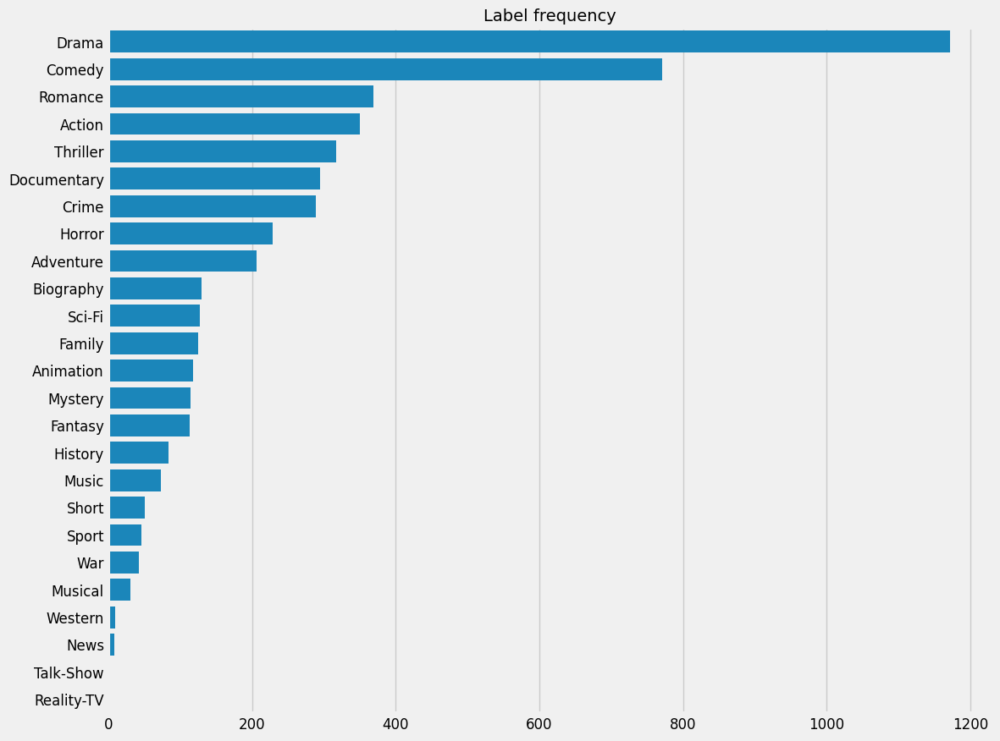

In [109]:
# Get label frequencies in descending order
label_freq = movies['Genre'].apply(lambda s: str(s).split('|')).explode().value_counts().sort_values(ascending=False)

# Bar plot
style.use("fivethirtyeight")
plt.figure(figsize=(12,10))
sns.barplot(y=label_freq.index.values, x=label_freq, order=label_freq.index)
plt.title("Label frequency", fontsize=14)
plt.xlabel("")
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

In [110]:
rare = list(label_freq[label_freq<100].index)
rare

['History',
 'Music',
 'Short',
 'Sport',
 'War',
 'Musical',
 'Western',
 'News',
 'Talk-Show',
 'Reality-TV']

In [111]:
unique = list(label_freq[label_freq>100].index)
unique

['Drama',
 'Comedy',
 'Romance',
 'Action',
 'Thriller',
 'Documentary',
 'Crime',
 'Horror',
 'Adventure',
 'Biography',
 'Sci-Fi',
 'Family',
 'Animation',
 'Mystery',
 'Fantasy']

In [112]:
movies.Genre = movies.Genre.apply(lambda s: [l for l in str(s).split('|') if l not in rare])

In [113]:
movies.Genre

0                     [Comedy, Drama]
1                             [Drama]
2                             [Drama]
3       [Adventure, Fantasy, Mystery]
4                             [Drama]
                    ...              
2340                 [Drama, Romance]
2341         [Documentary, Biography]
2342                 [Drama, Romance]
2343                  [Comedy, Drama]
2344                          [Drama]
Name: Genre, Length: 2342, dtype: object

In [114]:
X_train, X_val, y_train, y_val = train_test_split(movies['imdbId'], movies['Genre'], test_size=0.3, random_state=1337)

In [115]:
len(X_train)

1639

In [116]:
len(X_val)

703

In [117]:
X_train[:5]

616     1592556
1503    1878942
1244     105636
1521     102982
977     1479293
Name: imdbId, dtype: int64

In [118]:
%pwd

'/content/drive/My Drive/Multi-Label-Image-Classification'

In [119]:
# !pip install unzip
# !unzip data/images.zip

In [120]:
X_train = [os.path.join('./images', str(f)+'.jpg') for f in X_train]
X_val = [os.path.join('./images', str(f)+'.jpg') for f in X_val]

In [121]:
X_train[:5]

['./images/1592556.jpg',
 './images/1878942.jpg',
 './images/105636.jpg',
 './images/102982.jpg',
 './images/1479293.jpg']

In [122]:
import cv2
img = cv2.imread('./images/1980218.jpg', cv2.IMREAD_GRAYSCALE)

In [123]:
img

array([[186, 186, 186, ..., 255, 110, 219],
       [186, 186, 186, ..., 255, 120, 215],
       [186, 186, 186, ..., 255, 143, 224],
       ...,
       [136, 136, 136, ..., 136, 136, 136],
       [136, 136, 136, ..., 136, 136, 136],
       [136, 136, 136, ..., 136, 136, 136]], dtype=uint8)

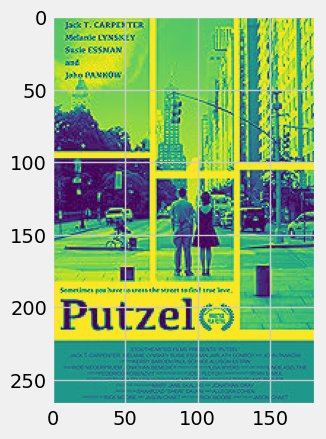

In [124]:
plt.imshow(img)

In [125]:
import os

count = 0
for file in X_val:
  if os.path.isfile(file) == True:
    count += 1
    # print(file)

print(count)

703


In [126]:
y_train

616                         [Drama]
1503              [Comedy, Romance]
1244             [Action, Thriller]
1521                       [Comedy]
977                   [Documentary]
                   ...             
1909      [Comedy, Fantasy, Horror]
1500                      [Romance]
1259               [Drama, Fantasy]
862                      [Thriller]
190     [Action, Adventure, Horror]
Name: Genre, Length: 1639, dtype: object

In [127]:
y_train = list(y_train)

In [128]:
y_val = list(y_val)

In [129]:
y_train

[['Drama'],
 ['Comedy', 'Romance'],
 ['Action', 'Thriller'],
 ['Comedy'],
 ['Documentary'],
 ['Animation', 'Action', 'Adventure'],
 ['Horror', 'Thriller'],
 ['Documentary'],
 ['Comedy', 'Drama'],
 ['Action', 'Crime', 'Thriller'],
 ['Sci-Fi', 'Thriller'],
 ['Comedy', 'Drama', 'Romance'],
 ['Family', 'Comedy'],
 ['Drama'],
 ['Action', 'Adventure', 'Comedy'],
 ['Action', 'Mystery', 'Thriller'],
 ['Drama'],
 ['Comedy'],
 ['Thriller'],
 ['Animation', 'Comedy'],
 ['Action', 'Drama'],
 ['Drama'],
 ['Fantasy'],
 ['Drama'],
 ['Crime', 'Drama', 'Thriller'],
 ['Action', 'Biography', 'Drama'],
 ['Animation', 'Adventure', 'Drama'],
 ['Comedy', 'Horror', 'Thriller'],
 ['Comedy', 'Crime', 'Drama'],
 ['Drama'],
 ['Action', 'Thriller'],
 ['Crime', 'Drama', 'Horror'],
 ['Drama'],
 ['Comedy', 'Family', 'Romance'],
 ['Comedy', 'Drama', 'Fantasy'],
 ['Documentary'],
 ['Action', 'Drama'],
 ['Animation', 'Sci-Fi'],
 ['Comedy', 'Drama'],
 ['Horror'],
 ['Comedy', 'Drama', 'Romance'],
 ['Action', 'Crime', 'Thri

In [130]:
# import os

# nobs = 8
# ncols = 4
# nrows = nobs//ncols

# style.use("default")
# plt.figure(figsize=(12,4*nrows))
# for i in range(nrows*ncols):
#     ax = plt.subplot(nrows, ncols, i+1)
#     if os.path.isfile(X_train[i]) == True:
#       plt.imshow(Image.open(X_train[i]))
#       plt.title(y_train[i], size=10)
#       plt.axis('off')
#     else:
#       pass

In [131]:
# import os
# import cv2

# img = cv2.imread(X_train[i])
# cv2_imshow(img)


# nobs = 8
# ncols = 4
# nrows = nobs//ncols

# style.use("default")
# plt.figure(figsize=(12,4*nrows))
# for i in range(nrows*ncols):
#     ax = plt.subplot(nrows, ncols, i+1)
#     if os.path.isfile(X_train[i]) == True:
#       plt.imshow(Image.open(X_train[i]))
#       plt.title(y_train[i], size=10)
#       plt.axis('off')
#     else:
#       pass

In [132]:
# Fit the multi-label binarizer on the training set
print("Labels:")
mlb = MultiLabelBinarizer()
mlb.fit(y_train)

Labels:


MultiLabelBinarizer()

In [133]:
# Loop over all labels and show them
N_LABELS = len(mlb.classes_)
for (i, label) in enumerate(mlb.classes_):
    print("{}. {}".format(i, label))

0. Action
1. Adventure
2. Animation
3. Biography
4. Comedy
5. Crime
6. Documentary
7. Drama
8. Family
9. Fantasy
10. Horror
11. Mystery
12. Romance
13. Sci-Fi
14. Thriller


In [134]:
mlb.classes_.itemsize

8

In [135]:
y_train_bin = mlb.transform(y_train)
y_train_bin

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 1, 0, 0],
       [1, 0, 0, ..., 0, 0, 1],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 1],
       [1, 1, 0, ..., 0, 0, 0]])

In [136]:
y_val_bin = mlb.transform(y_val)
y_val_bin

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 1, 1, 0],
       ...,
       [1, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 1],
       [1, 0, 0, ..., 0, 0, 1]])

In [137]:
print(y_train_bin[5],
      y_val_bin[5])

[1 1 1 0 0 0 0 0 0 0 0 0 0 0 0] [1 0 0 0 0 1 0 0 0 0 0 0 0 0 1]


In [138]:
# style.use("default")
# plt.figure(figsize=(12,4*nrows))
# for i in range(nrows*ncols):
#     ax = plt.subplot(nrows, ncols, i+1)
#     plt.imshow(Image.open(X_train[i]))
#     plt.title(y_train_bin[i], size=10)
#     plt.axis('off')

In [139]:
IMG_SIZE = 100
CHANNELS = 3

In [140]:
def parse_function(filename, label):
    """Function that returns a tuple of normalized image array and labels array.
    Args:
        filename: string representing path to image
        label: 0/1 one-dimensional array of size N_LABELS
    """
    # Read an image from a file
    image_string = tf.io.read_file(filename)
    # Decode it into a dense vector
    image_decoded = tf.image.decode_jpeg(image_string, channels=CHANNELS)
    # Resize it to fixed shape
    image_resized = tf.image.resize(image_decoded, [IMG_SIZE, IMG_SIZE])
    # Normalize it from [0, 255] to [0.0, 1.0]
    image_normalized = image_resized / 255.0
    return image_normalized, label

In [141]:
BATCH_SIZE = 256 # Big enough to measure an F1-score
AUTOTUNE = tf.data.experimental.AUTOTUNE # Adapt preprocessing and prefetching dynamically to reduce GPU and CPU idle time
SHUFFLE_BUFFER_SIZE = 1024 # Shuffle the training data by a chunck of 1024 observations

In [142]:
def create_dataset(filenames, labels, is_training=True):
    """Load and parse dataset.
    Args:
        filenames: list of image paths
        labels: numpy array of shape (BATCH_SIZE, N_LABELS)
        is_training: boolean to indicate training mode
    """

    # Create a first dataset of file paths and labels
    dataset = tf.data.Dataset.from_tensor_slices((filenames, labels))
    # Parse and preprocess observations in parallel
    dataset = dataset.map(parse_function, num_parallel_calls=AUTOTUNE)

    if is_training == True:
        # This is a small dataset, only load it once, and keep it in memory.
        dataset = dataset.cache()
        # Shuffle the data each buffer size
        dataset = dataset.shuffle(buffer_size=SHUFFLE_BUFFER_SIZE)

    # Batch the data for multiple steps
    dataset = dataset.batch(BATCH_SIZE)
    # Fetch batches in the background while the model is training.
    dataset = dataset.prefetch(buffer_size=AUTOTUNE)

    return dataset

In [143]:
train_ds = create_dataset(X_train, y_train_bin)
val_ds = create_dataset(X_val, y_val_bin)

In [144]:
# feature_extractor_url = "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_ft1k_m/classification/2"
feature_extractor_url = "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_ft1k_b0/classification/2"
input = Input((IMG_SIZE, IMG_SIZE, CHANNELS))
feature_extractor_layer = hub.KerasLayer(feature_extractor_url, trainable = False)(input)
# x = Dense(2048)(feature_extractor_layer)
# x = BatchNormalization()(x)
# x = activations.relu(x)
x = Dropout(0.2)(feature_extractor_layer)
x = Dense(1024, activation = 'relu')(x)
x = Dropout(0.2)(x)
output = Dense(N_LABELS, activation='sigmoid')(x)

model = Model(input, output)

In [145]:
model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 100, 100, 3)]     0         
                                                                 
 keras_layer_1 (KerasLayer)  (None, 1000)              7200312   
                                                                 
 dropout_2 (Dropout)         (None, 1000)              0         
                                                                 
 dense_2 (Dense)             (None, 1024)              1025024   
                                                                 
 dropout_3 (Dropout)         (None, 1024)              0         
                                                                 
 dense_3 (Dense)             (None, 15)                15375     
                                                                 
Total params: 8240711 (31.44 MB)
Trainable params: 1040399 

In [146]:
@tf.function
def macro_soft_f1(y, y_hat):
    """Compute the macro soft F1-score as a cost (average 1 - soft-F1 across all labels).
    Use probability values instead of binary predictions.

    Args:
        y (int32 Tensor): targets array of shape (BATCH_SIZE, N_LABELS)
        y_hat (float32 Tensor): probability matrix from forward propagation of shape (BATCH_SIZE, N_LABELS)

    Returns:
        cost (scalar Tensor): value of the cost function for the batch
    """
    y = tf.cast(y, tf.float32)
    y_hat = tf.cast(y_hat, tf.float32)
    tp = tf.reduce_sum(y_hat * y, axis=0)
    fp = tf.reduce_sum(y_hat * (1 - y), axis=0)
    fn = tf.reduce_sum((1 - y_hat) * y, axis=0)
    soft_f1 = 2*tp / (2*tp + fn + fp + 1e-16)
    cost = 1 - soft_f1 # reduce 1 - soft-f1 in order to increase soft-f1
    macro_cost = tf.reduce_mean(cost) # average on all labels
    return macro_cost

In [147]:
@tf.function
def macro_f1(y, y_hat, thresh=0.5):
    """Compute the macro F1-score on a batch of observations (average F1 across labels)

    Args:
        y (int32 Tensor): labels array of shape (BATCH_SIZE, N_LABELS)
        y_hat (float32 Tensor): probability matrix from forward propagation of shape (BATCH_SIZE, N_LABELS)
        thresh: probability value above which we predict positive

    Returns:
        macro_f1 (scalar Tensor): value of macro F1 for the batch
    """
    y_pred = tf.cast(tf.greater(y_hat, thresh), tf.float32)
    tp = tf.cast(tf.math.count_nonzero(y_pred * y, axis=0), tf.float32)
    fp = tf.cast(tf.math.count_nonzero(y_pred * (1 - y), axis=0), tf.float32)
    fn = tf.cast(tf.math.count_nonzero((1 - y_pred) * y, axis=0), tf.float32)
    f1 = 2*tp / (2*tp + fn + fp + 1e-16)
    macro_f1 = tf.reduce_mean(f1)
    return macro_f1

In [148]:
LR = 1e-5
EPOCHS = 100

In [149]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=LR),
              loss = macro_soft_f1,
               metrics=[macro_f1])

In [150]:
pwd

'/content/drive/My Drive/Multi-Label-Image-Classification'

In [151]:
# logdir = "logs" + datetime.now().strftime("%Y%m%d-%H%M%S")
# tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir = logdir)

# logdir

In [152]:
# %load_ext tensorboard

In [153]:
# # %reload_ext tensorboard
# %tensorboard --logdir={logdir}

In [154]:
t1 = time()
history = model.fit(train_ds,
                    epochs=EPOCHS,
                    validation_data=create_dataset(X_val, y_val_bin))
                    # batch_size = 256)
                    # callbacks = [tensorboard_callback])
print(f'traing in {(time()-t1)}s')

Epoch 1/100
7/7 [==============================] - 20s 950ms/step - loss: 0.8076 - macro_f1: 0.1960 - val_loss: 0.8061 - val_macro_f1: 0.1898
Epoch 2/100
7/7 [==============================] - 1s 148ms/step - loss: 0.8027 - macro_f1: 0.1993 - val_loss: 0.8010 - val_macro_f1: 0.1982
Epoch 3/100
7/7 [==============================] - 1s 145ms/step - loss: 0.7988 - macro_f1: 0.2058 - val_loss: 0.7970 - val_macro_f1: 0.2049
Epoch 4/100
7/7 [==============================] - 1s 157ms/step - loss: 0.7971 - macro_f1: 0.2034 - val_loss: 0.7940 - val_macro_f1: 0.2101
Epoch 5/100
7/7 [==============================] - 1s 144ms/step - loss: 0.7923 - macro_f1: 0.2157 - val_loss: 0.7916 - val_macro_f1: 0.2162
Epoch 6/100
7/7 [==============================] - 1s 137ms/step - loss: 0.7920 - macro_f1: 0.2140 - val_loss: 0.7893 - val_macro_f1: 0.2207
Epoch 7/100
7/7 [==============================] - 1s 135ms/step - loss: 0.7873 - macro_f1: 0.2249 - val_loss: 0.7875 - val_macro_f1: 0.2244
Epoch 8/100


In [155]:
# %mkdir models
%pwd

'/content/drive/MyDrive/Multi-Label-Image-Classification'

In [156]:
%cd models
model.save_weights('best_weight.h5')
json_string = model.to_json()

with open('config.json', 'w') as f:
    f.write(json_string)
%cd ..

/content/drive/MyDrive/Multi-Label-Image-Classification/models
/content/drive/MyDrive/Multi-Label-Image-Classification


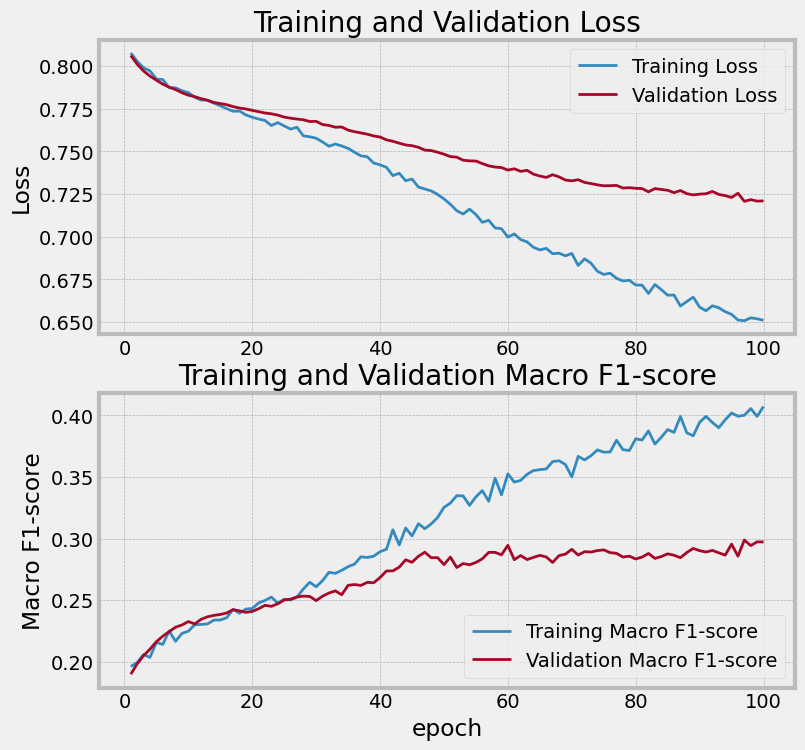

In [157]:
model_losses, model_val_losses, model_macro_f1s, model_val_macro_f1s = learning_curves(history)

In [158]:
model_val_losses[-1]

0.7209473848342896

In [159]:
model_val_macro_f1s[-1]

0.2972133755683899

In [160]:
def show_prediction(title, movies_df, model):

    # Get movie info
    imdbId = movies.loc[movies['Title']==title]['imdbId'].iloc[0]
    genre = movies.loc[movies['Title']==title]['Genre'].iloc[0]
    img_path = os.path.join('./images', str(imdbId)+'.jpg')

    # Read and prepare image
    img = image.load_img(img_path, target_size=(IMG_SIZE,IMG_SIZE,CHANNELS))
    img = image.img_to_array(img)
    img = img/255
    img = np.expand_dims(img, axis=0)

    # Generate prediction
    prediction = (model.predict(img) > 0.5).astype('int')
    prediction = pd.Series(prediction[0])
    prediction.index = mlb.classes_
    prediction = prediction[prediction==1].index.values

    # Dispaly image with prediction
    style.use('default')
    plt.figure(figsize=(8,4))
    plt.imshow(Image.open(img_path))
    plt.title('\n\n{}\n\nGenre\n{}\n\nPrediction\n{}\n'.format(title, genre, list(prediction)[:5]), fontsize=9)
    plt.show()

1/1 [==============================] - 2s 2s/step


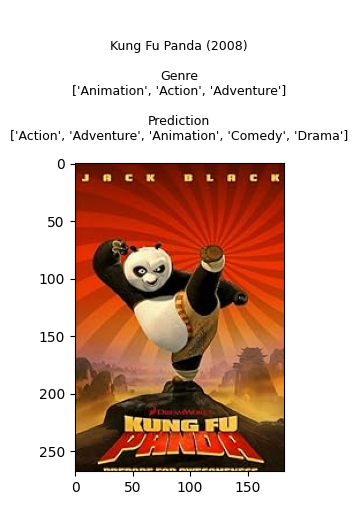

1/1 [==============================] - 0s 78ms/step


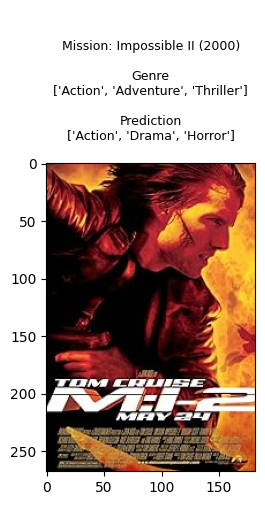

1/1 [==============================] - 0s 65ms/step


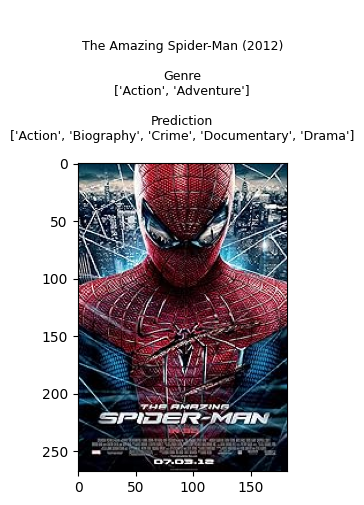

In [161]:
titles = ["Kung Fu Panda (2008)",
          "Mission: Impossible II (2000)",
          "The Amazing Spider-Man (2012)"]

for t in titles:
  if t in movies['Title'].values:
    show_prediction(t, movies, model)

In [162]:
X = movies['imdbId']
y = list(movies['Genre'])

X = [os.path.join('./images', str(f)+'.jpg') for f in X]

mlb = MultiLabelBinarizer()
y_bin = mlb.fit_transform(y)
X[:5], y_bin[:5]

(['./images/1450330.jpg',
  './images/1018830.jpg',
  './images/964185.jpg',
  './images/2245906.jpg',
  './images/1727381.jpg'],
 array([[0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]]))

In [163]:
ds = list(zip(X, y_bin))

In [164]:
LOG_DIR = "run"

In [165]:
embeddings = tf.keras.models.Model(
    inputs=model.inputs,
    outputs=model.layers[-2].output
)

In [166]:
embeddings.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 100, 100, 3)]     0         
                                                                 
 keras_layer_1 (KerasLayer)  (None, 1000)              7200312   
                                                                 
 dropout_2 (Dropout)         (None, 1000)              0         
                                                                 
 dense_2 (Dense)             (None, 1024)              1025024   
                                                                 
 dropout_3 (Dropout)         (None, 1024)              0         
                                                                 
Total params: 8225336 (31.38 MB)
Trainable params: 1025024 (3.91 MB)
Non-trainable params: 7200312 (27.47 MB)
_________________________________________________________________


In [167]:
# image_path = ds[1][0]
# image_path

In [168]:
# img = tf.io.read_file(img_path)
# img = tf.image.decode_jpeg(img, channels=3)
# img = tf.image.resize(img, [224,224])
# # img = tf.transpose(img, perm=[2, 0, 1])
# img = tf.cast(img, tf.float32) / 255.0
# img

In [169]:
# img = tf.io.read_file(image_path)
# img = tf.image.decode_jpeg(img, channels=3)
# img = tf.image.resize(img, [224, 224])
# img = tf.transpose(img, perm=[2, 0, 1])
# img = tf.cast(img, tf.float32) / 255.0
# img

In [170]:
def get_img(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, [100,100])
    # img = tf.transpose(img, perm=[2, 0, 1])
    img = tf.cast(img, tf.float32) / 255.0
    return img
# Generate embeddings
images_pil = []
images_embeddings = []
labels = []
for x in ds:
    img_path = x[0]
    # print(img_path)
    img_tf = get_img(img_path)
    # Save both tf image for prediction and PIL image for sprite
    img_pil = Image.open(img_path).resize((100, 100))
    img_embedding = embeddings(tf.expand_dims(img_tf, axis=0))
    images_embeddings.append(img_embedding.numpy()[0])
    images_pil.append(img_pil)
    # Assuming your output data is directly the label
    label = x[1]
    labels.append(label)

In [171]:
with open(f'{LOG_DIR}/feature_vecs.tsv', 'w') as fw:
    csv_writer = csv.writer(fw, delimiter='\t')
    csv_writer.writerows(images_embeddings)

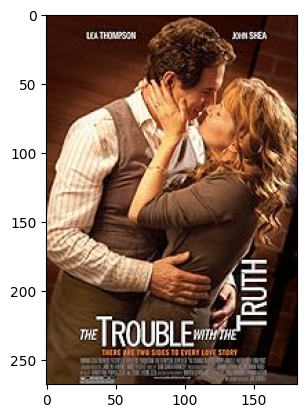

In [172]:
img_path = ds[4][0]
img = cv2.imread(img_path, cv2.IMREAD_COLOR)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

In [173]:
img_data=[]
for img in tqdm(ds):
    input_img = cv2.imread(img[0], cv2.IMREAD_COLOR)
    input_img = cv2.cvtColor(input_img, cv2.COLOR_BGR2RGB)
    input_img_resize = cv2.resize(input_img, (100,100))
    # print(input_img_resize.shape)
    img_data.append(input_img_resize)
img_data = np.array(img_data)

100%|██████████| 2342/2342 [00:13<00:00, 170.17it/s]


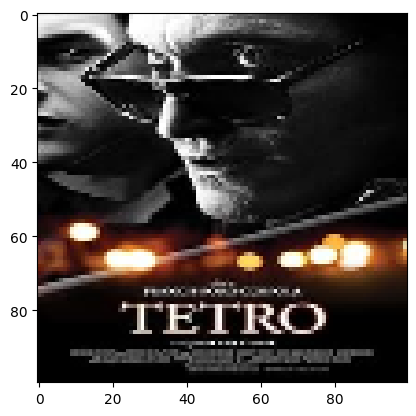

In [174]:
img = img_data[2]
plt.imshow(img)

In [175]:
one_square_size = int(np.ceil(np.sqrt(len(img_data))))
master_width = 100 * one_square_size
master_height = 100 * one_square_size

master = Image.new(
    mode='RGB',
    size=(master_width, master_height),
    color=(0,0,0))  # fully transparent

for count, image in enumerate(img_data):
    row = int(np.floor(count / one_square_size))
    col = count % one_square_size
    pil_image = Image.fromarray(image)
    master.paste(pil_image, (col * 100, row * 100))
master.convert("RGB").save(f'{LOG_DIR}/sprite.jpg', transparency=0)

In [176]:
# one_square_size = int(np.ceil(np.sqrt(len(img_data))))
# master_width = 224 * one_square_size
# master_height = 224 * one_square_size
# spriteimage = Image.new(
#     mode='RGB',
#     size=(master_width, master_height),
#     color=(0,0,0) # fully transparent
# )
# for count, image in enumerate(img_data):
#     div, mod = divmod(count, one_square_size)
#     h_loc = 224 * div
#     w_loc = 224 * mod
#     pil_image = Image.fromarray(image)
#     spriteimage.paste(pil_image, (w_loc, h_loc))
# spriteimage.convert("RGB").save(f'{LOG_DIR}/sprite.jpg', transparency=0)

In [177]:
# inverse_transform

In [178]:
with open(f'{LOG_DIR}/metadata.tsv', 'w') as file: # /embeddings
    for name in movies['Title']:
        file.write(f"{name}\n")

In [179]:
# features = tf.Variable(embeddings.layers[-1].get_weights()[0])
# checkpoint = tf.train.Checkpoint(embedding=features)
# checkpoint.save(os.path.join(LOG_DIR, "embedding.ckpt"))

In [180]:
# config = projector.ProjectorConfig()
# embedding = config.embeddings.add()
# embedding.tensor_name = "Movie posters-grouned feature vector projector"
# embedding.metadata_path = "metadata.tsv"
# embedding.sprite.image_path = "sprite.jpg"
# embedding.sprite.single_image_dim.extend([100, 100])
# projector.visualize_embeddings(LOG_DIR, config)

In [181]:
LOG_DIR

'run'

In [182]:
%tensorboard --logdir=run

Reusing TensorBoard on port 6006 (pid 7361), started 0:14:10 ago. (Use '!kill 7361' to kill it.)

<IPython.core.display.Javascript object>